In [1]:
# Load Libraries
library(Seurat)
library(SingleR)
library(voxhunt)
library(patchwork)
library(dplyr)
library(data.table)
library(msigdbr)
library(fgsea)
library(ggplot2)
library(ComplexHeatmap)
library(gplots)
library(SCopeLoomR)
library(SCENIC)
library(AUCell)
library(KernSmooth)
library(plotly)
library(patchwork)
library(RColorBrewer)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
 

In [2]:
# Set Working Directory
setwd("../")

# Load Data

In [3]:
data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/1_DataPreprocessing.rds")
data

An object of class Seurat 
25403 features across 5073 samples within 2 assays 
Active assay: RNA (25400 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: HTO
 2 dimensional reductions calculated: pca, umap

# Extended Fig 2b - HTO expression

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


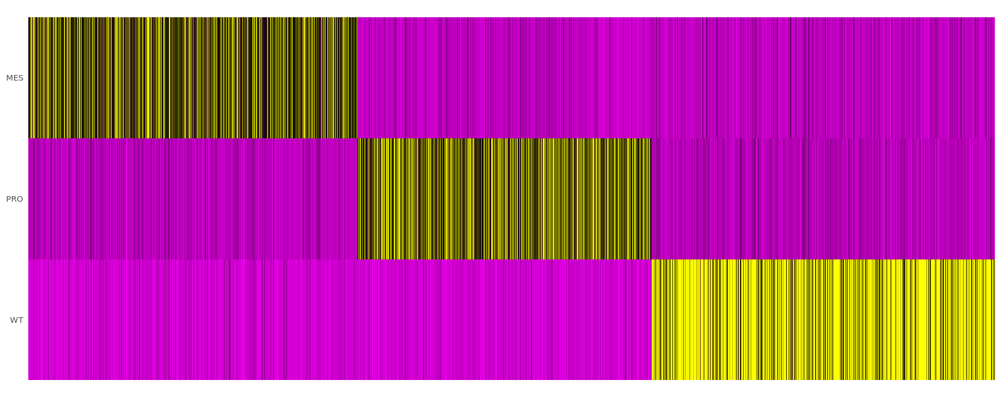

In [4]:
# Visualize enrichment for selected HTOs based on Cell Hashing paper (https://doi.org/10.1186/s13059-018-1603-1)
Idents(data) <- "HTO_maxID"
HTOplot_1 <- RidgePlot(data, assay = "HTO", features = rownames(data[["HTO"]])[1:3], ncol = 3, group.by = "HTO_maxID")
#ggsave("GBMProject/GBMOrganoid/Figures/HTO_QC/HTOplot_1.png", plot = HTOplot_1)

HTOplot_2 <- HTOHeatmap(data, assay = "HTO")
#ggsave("GBMProject/GBMOrganoid/Figures/HTO_QC/HTOplot_2.png", plot = HTOplot_2)

options(repr.plot.width = 15, repr.plot.height = 6)
HTOplot_2 + NoLegend()

# Extended Fig 2c - Heatmap of CRISPR editted genes

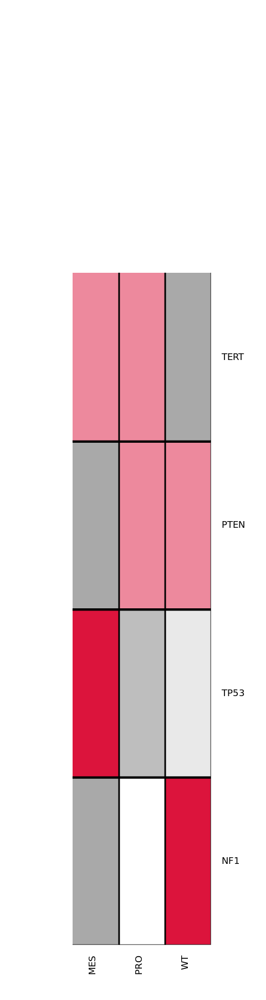

In [49]:
gene.list <-c("NF1","PTEN","TP53","TERT")
av.exp <- AverageExpression(data, assays="RNA", group.by='HTO_maxID', features=gene.list)
av.exp <- data.matrix(av.exp[[1]], rownames.force = NA)
palette = colorRampPalette(c("darkgray","white","#DC143C")) (9)

options(repr.plot.width = 4, repr.plot.height = 15)
heatmap.2(x = av.exp,dendrogram='none',col=palette, trace="none",density.info="none",key=FALSE,scale="row",Rowv=FALSE,Colv=FALSE,sepwidth=c(0.02,0.01),
           sepcolor="black",cexCol=1,cexRow = 1, colsep=1:ncol(av.exp), rowsep=1:nrow(av.exp))

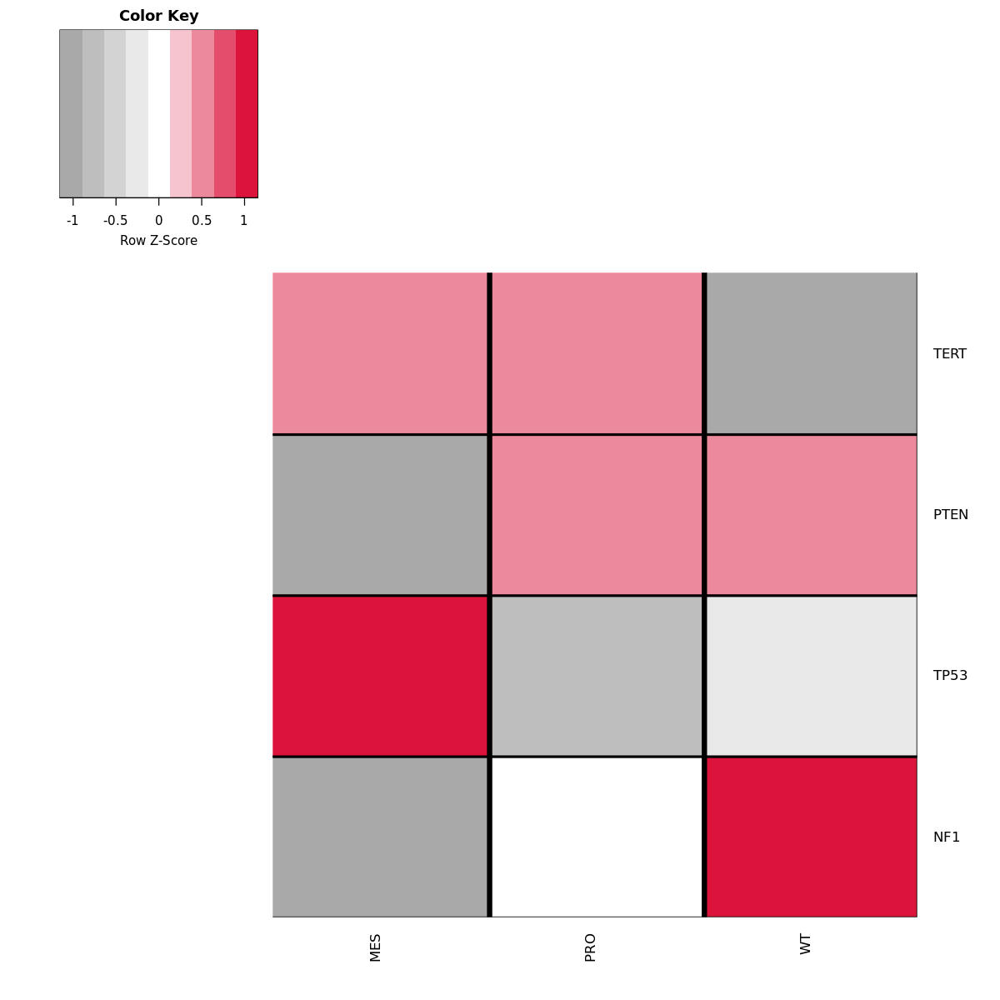

In [48]:
options(repr.plot.width = 10, repr.plot.height = 10)
heatmap.2(x = av.exp,dendrogram='none',col=palette, trace="none",density.info="none",key=TRUE,scale="row",Rowv=FALSE,Colv=FALSE,sepwidth=c(0.02,0.01),
           sepcolor="black",cexCol=1,cexRow = 1, colsep=1:ncol(av.exp), rowsep=1:nrow(av.exp))

# Extended Fig 2d - VoxHunt

In [64]:
vox_map <- readRDS("GBMProject/GBMOrganoid/Checkpoints/VoxHunt_voxmap.rds")

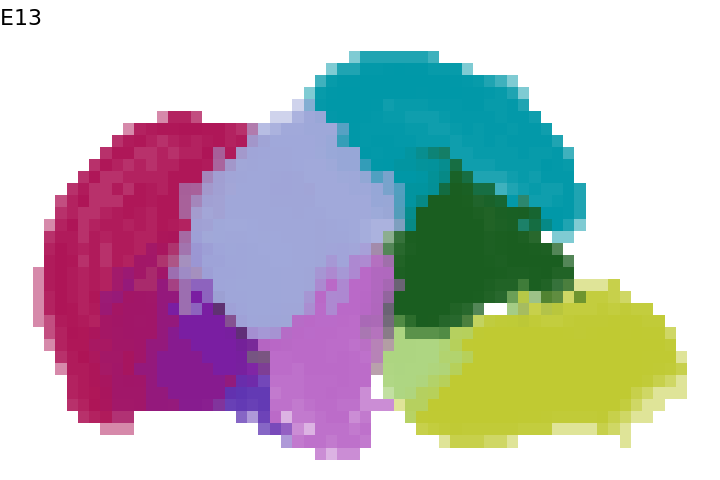

In [65]:
options(repr.plot.width = 6, repr.plot.height = 4)
voxhunt::plot_annotation('E13')

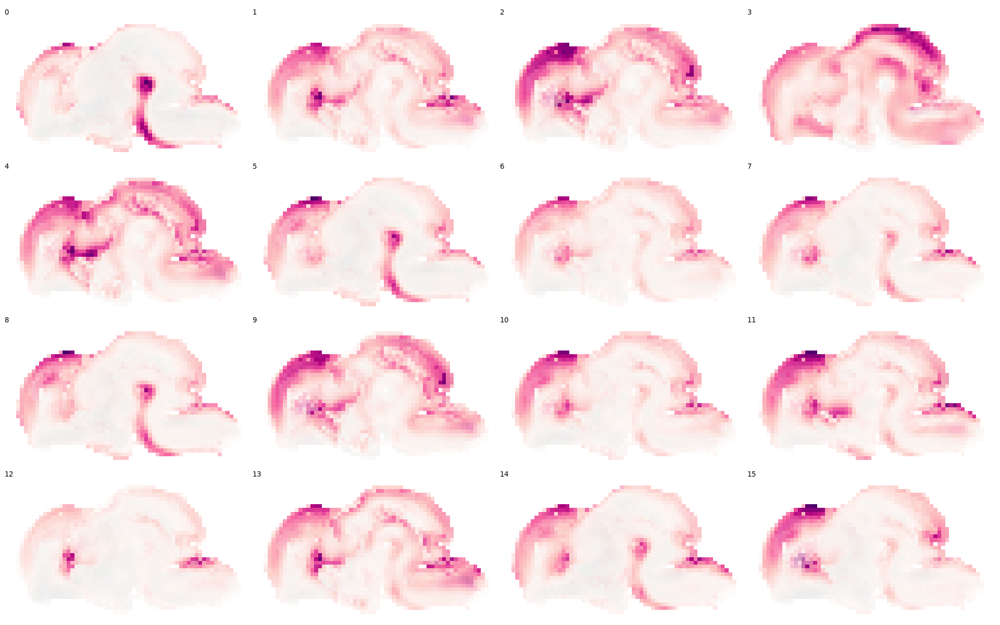

In [70]:
options(repr.plot.width = 16, repr.plot.height = 10)
plot_map(vox_map) + plot_layout(axes = "collect", axis_titles = "collect", guides="collect") &
  theme(legend.position='none')

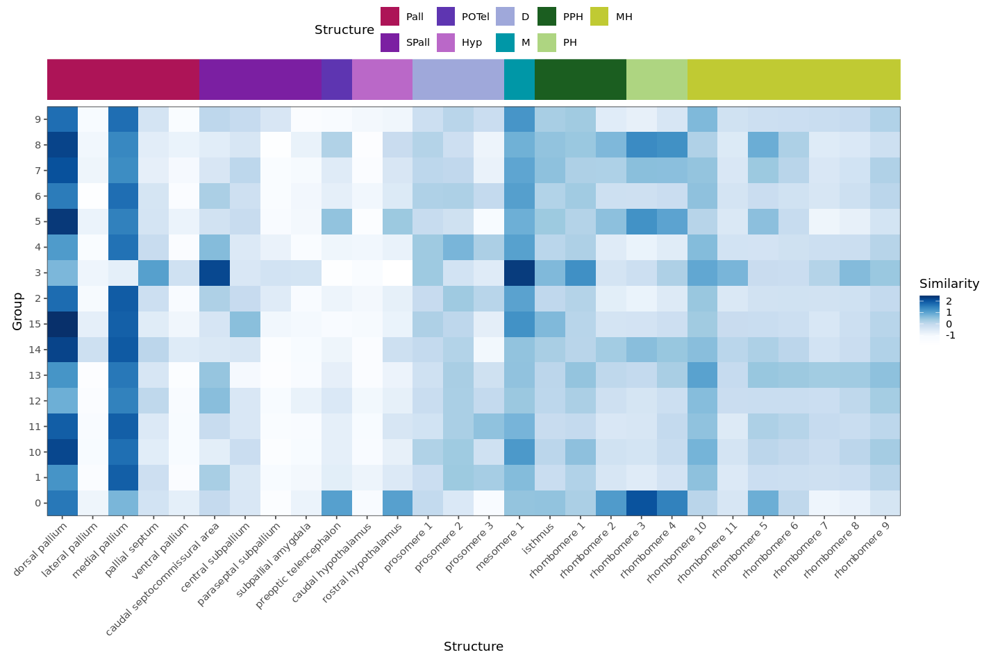

In [67]:
options(repr.plot.width = 12, repr.plot.height = 8)
plot_structure_similarity(vox_map, cluster=F)

# Extended Fig 2e - UMAP Predicted Cell Type

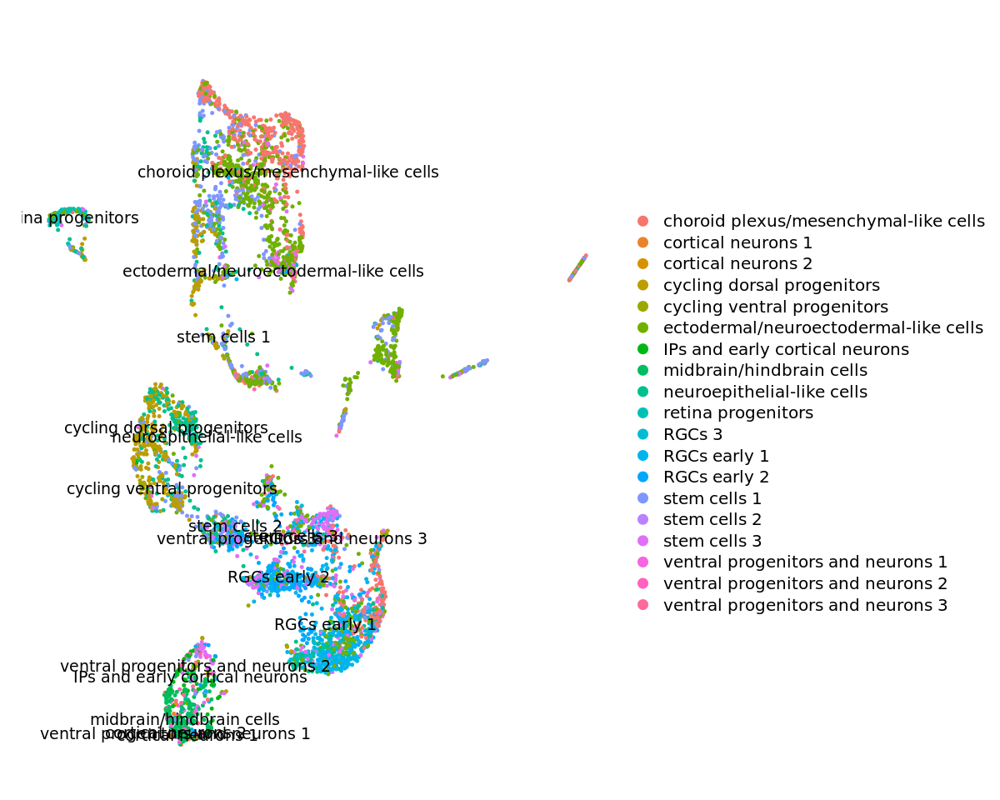

In [16]:
options(repr.plot.width = 10, repr.plot.height = 8)
DimPlot(data, group.by = "SingleR.labels", label = TRUE, 
       pt.size=0.75) + NoAxes() + ggtitle("") 

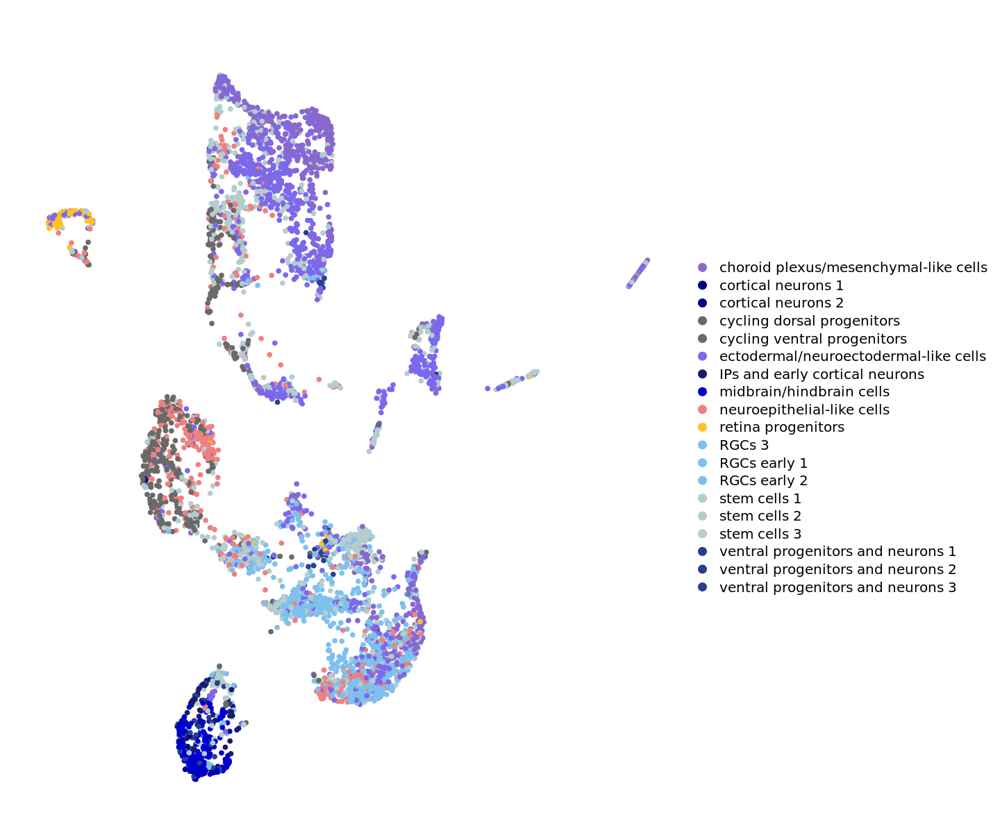

In [61]:
options(repr.plot.width = 12, repr.plot.height = 10)
DimPlot(data, group.by = "SingleR.labels", label = FALSE, 
        cols=c('choroid plexus/mesenchymal-like cells'='mediumpurple3',
               'cortical neurons 1'='navyblue', 'cortical neurons 2'='navyblue',
               'cycling dorsal progenitors'='dimgray','cycling ventral progenitors'='dimgray',
               'ectodermal/neuroectodermal-like cells'='mediumslateblue',
               'IPs and early cortical neurons'='midnightblue',
               'midbrain/hindbrain cells'='mediumblue',
               'neuroepithelial-like cells'='lightcoral',
               'retina progenitors'='goldenrod1',
               'RGCs 3'='skyblue2','RGCs early 1'='skyblue2','RGCs early 2'='skyblue2',
               'stem cells 1'='lightcyan3','stem cells 2'='lightcyan3','stem cells 3'='lightcyan3',
               'ventral progenitors and neurons 1'='royalblue4','ventral progenitors and neurons 2'='royalblue4','ventral progenitors and neurons 3'='royalblue4'), pt.size=1.5) + 
    NoAxes() + ggtitle("") #+ NoLegend()

In [48]:
Idents(data) <- 'SingleR.labels'
levels(data)

[1] "midbrain/hindbrain cells"             
 [2] "neuroepithelial-like cells"           
 [3] "RGCs early 1"                         
 [4] "ectodermal/neuroectodermal-like cells"
 [5] "cycling dorsal progenitors"           
 [6] "stem cells 1"                         
 [7] "stem cells 3"                         
 [8] "choroid plexus/mesenchymal-like cells"
 [9] "retina progenitors"                   
[10] "stem cells 2"                         
[11] "RGCs early 2"                         
[12] "ventral progenitors and neurons 3"    
[13] "cycling ventral progenitors"          
[14] "ventral progenitors and neurons 2"    
[15] "IPs and early cortical neurons"       
[16] "cortical neurons 1"                   
[17] "RGCs 3"                               
[18] "ventral progenitors and neurons 1"    
[19] "cortical neurons 2"

# Extended Fig 2f - SingleR Correlation Scores

In [49]:
pred <- readRDS("GBMProject/GBMOrganoid/Checkpoints/SingleR_clFullLineage.rds")

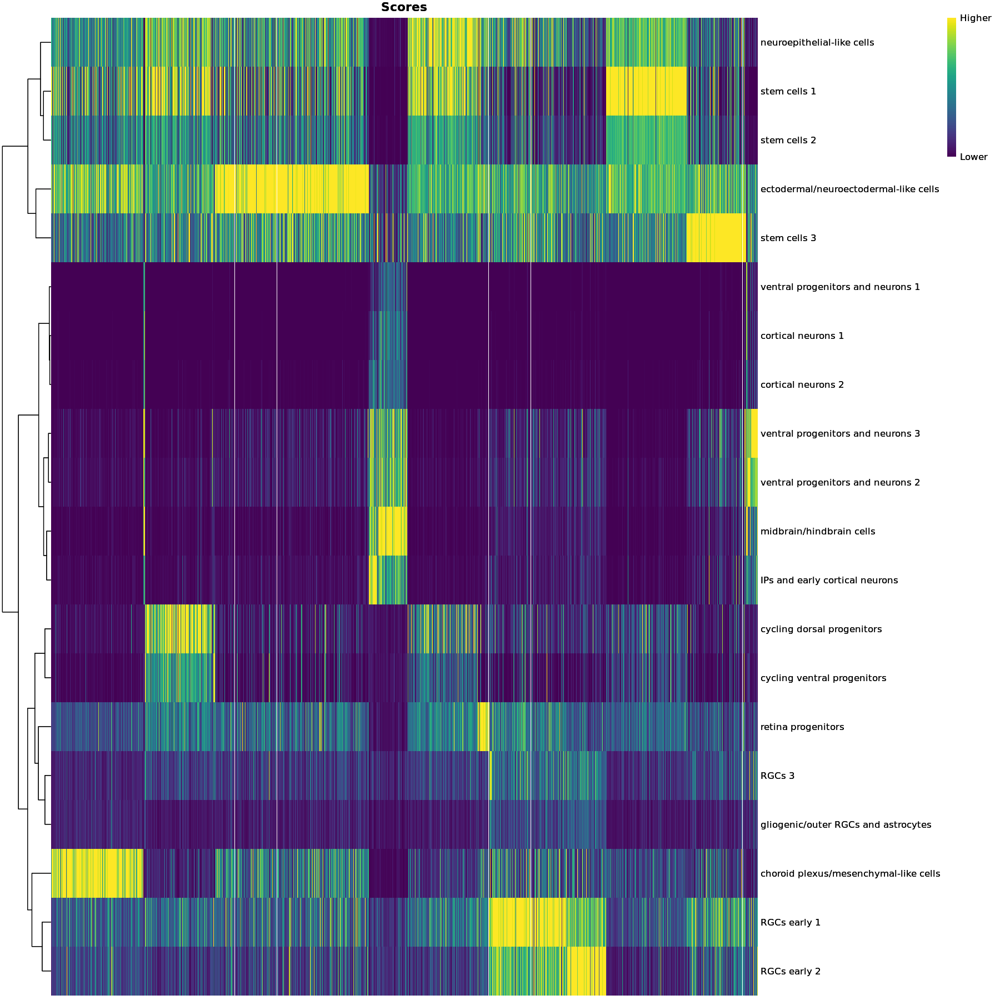

In [63]:
options(repr.plot.width = 15, repr.plot.height = 15)
plotScoreHeatmap(pred, show.labels=FALSE)

# Extended Fig 3 - SCENIC GRN Analysis

## Load Data

In [7]:
data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/2_iGRNs.rds")
loom <- open_loom("GBMProject/GBMOrganoid/SCENIC/output_organoid.loom", mode = "r+")

# Read information from loom file:
exprMat <- get_dgem(loom)
exprMat_log <- log2(exprMat+1) # Better if it is logged/normalized
regulons_incidMat <- get_regulons(loom, column.attr.name='Regulons')
regulons <- regulonsToGeneLists(regulons_incidMat)
regulonAUC <- get_regulons_AUC(loom, column.attr.name='RegulonsAUC')
regulonAucThresholds <- get_regulon_thresholds(loom)
embeddings <- get_embeddings(loom)
genotype <- get_cell_annotation(loom,annotations.columns = "genotype")
celltype <- get_cell_annotation(loom,annotations.columns = "maincelltype")
celltype2 <- get_cell_annotation(loom,annotations.columns = "subcelltype")
cluster <- get_cell_annotation(loom,annotations.columns = "cluster")

close_loom(loom)

## Extended Fig. 3a - UMAP

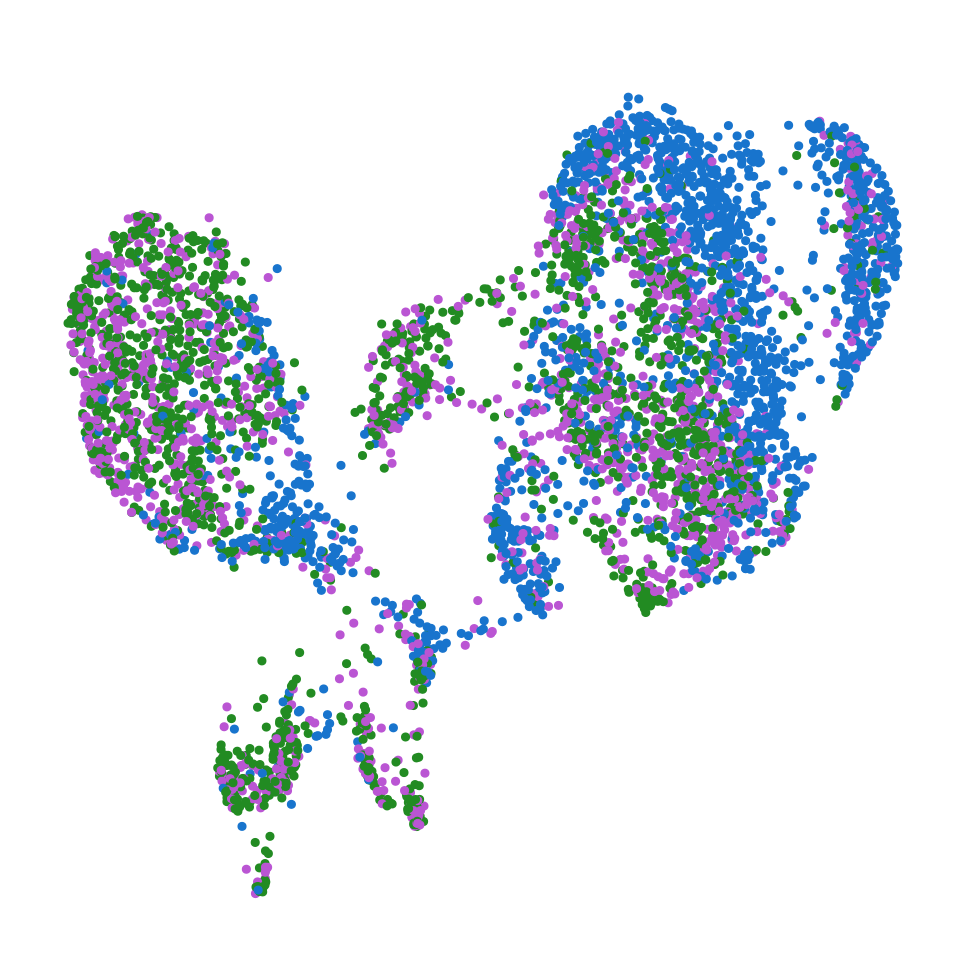

In [8]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(data, reduction="umap_grn", group.by = "HTO_maxID", label = FALSE, 
        cols=c("MES"="forestgreen","PRO"="mediumorchid","WT"="dodgerblue3"), pt.size=1.5) + NoAxes() + ggtitle("") + NoLegend()

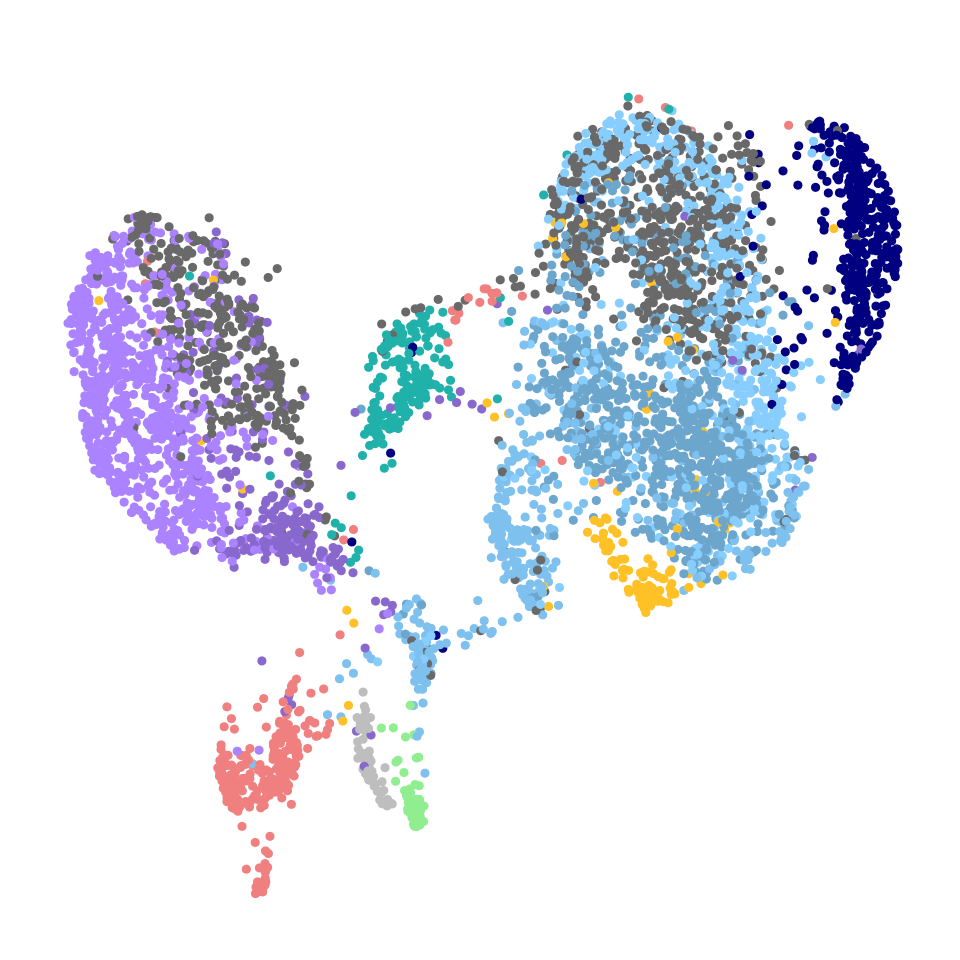

In [9]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(data, reduction="umap_grn", group.by = "celltype2", cols=c("Mesenchyme-1"="mediumpurple1","Mesenchyme-2"="mediumpurple3",
            "Neuroepithelial"="lightcoral","Endothelial"="gray","Microglia"="lightgreen", "NeuralCrest"="lightseagreen","Retinal"="goldenrod1",
            "RGC-1"="skyblue1","RGC-2"="skyblue3", "RGC-3"="skyblue2","Neuronal"="navyblue","Proliferating"="dimgray"), label = FALSE, 
        pt.size=1.5) + NoAxes() + ggtitle("") + NoLegend()

## Extended Fig. 3b - RSS

In [10]:
selectedResolution <- "genotype" # select resolution  
rss2 <- calcRSS(AUC=getAUC(regulonAUC), cellAnnotation=genotype[colnames(regulonAUC), selectedResolution])

Loading required package: BiocParallel



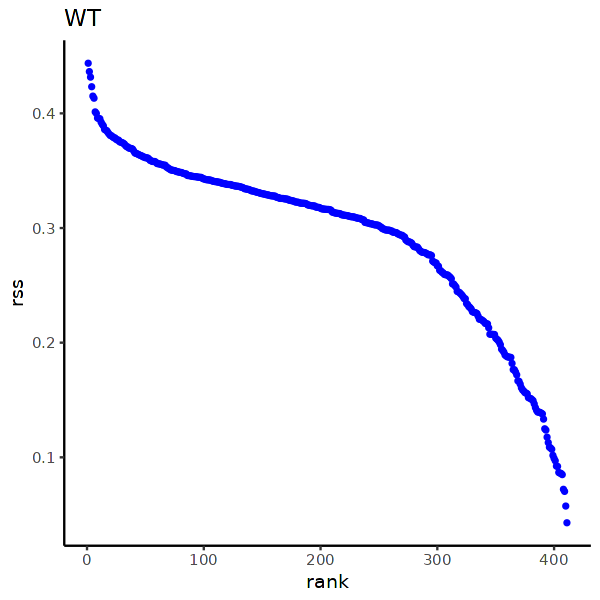

In [11]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
plotRSS_oneSet(rss2, setName = "WT", n=0) # cluster ID

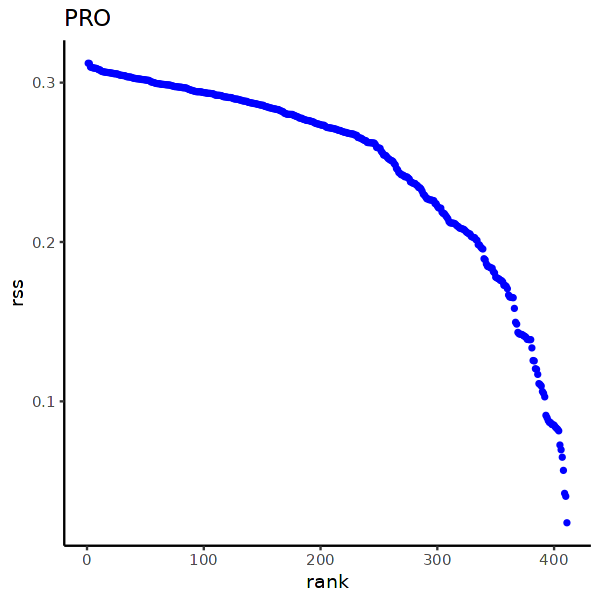

In [12]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
plotRSS_oneSet(rss2, setName = "PRO", n=0) # cluster ID

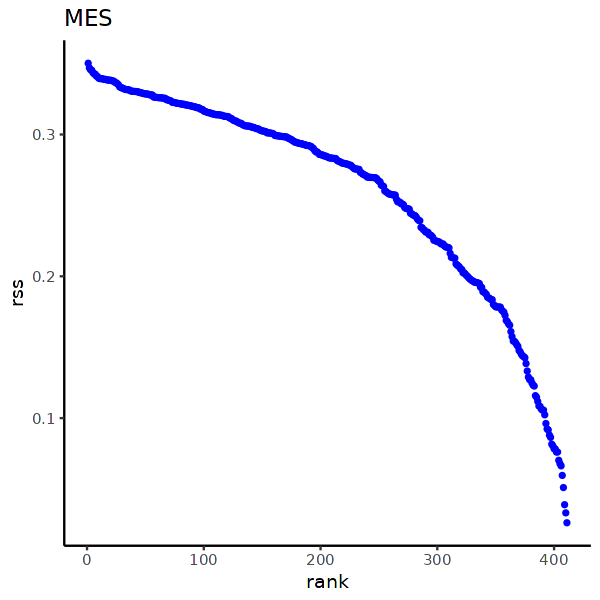

In [13]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
plotRSS_oneSet(rss2, setName = "MES", n=0) # cluster ID

## Extended Fig. 3c - Variable Genes

Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


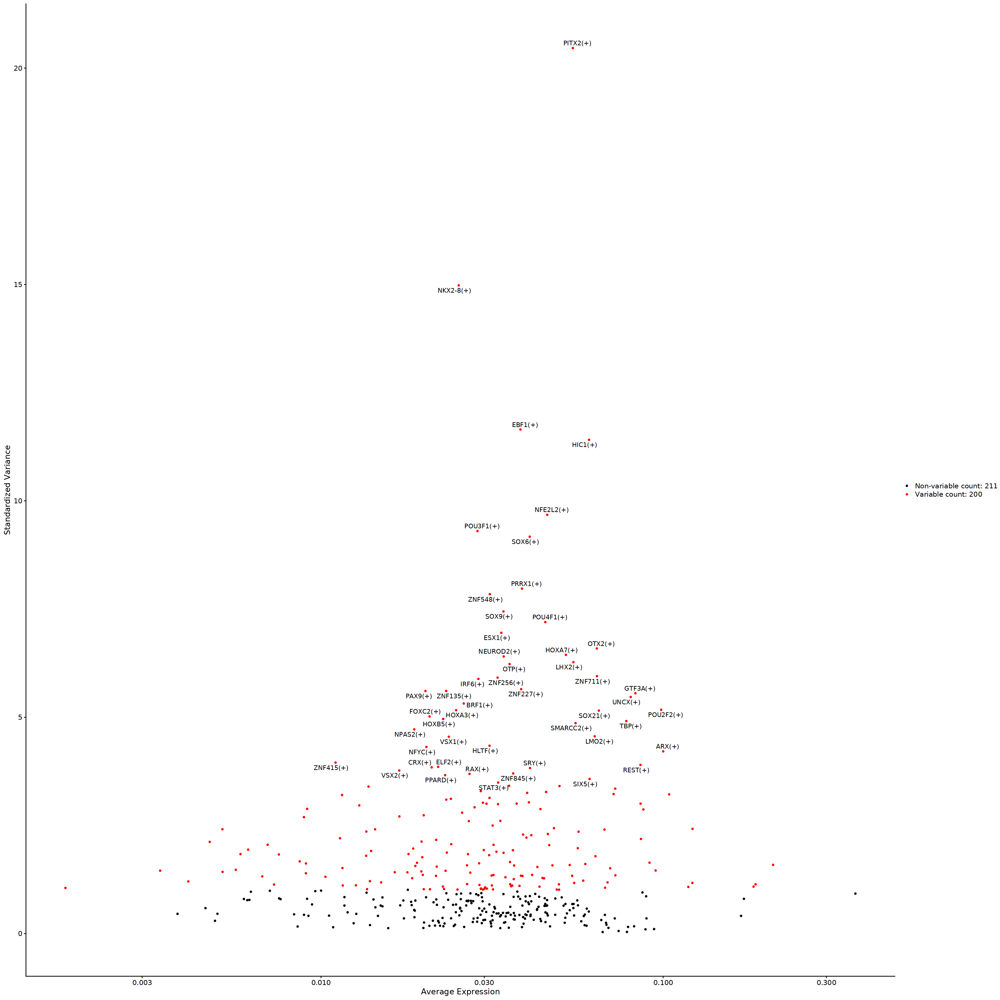

In [14]:
options(repr.plot.width=25, repr.plot.height=25) # To set the figure size in Jupyter

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(data), 50)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(data)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE, xnudge=0, ynudge=0)
plot2

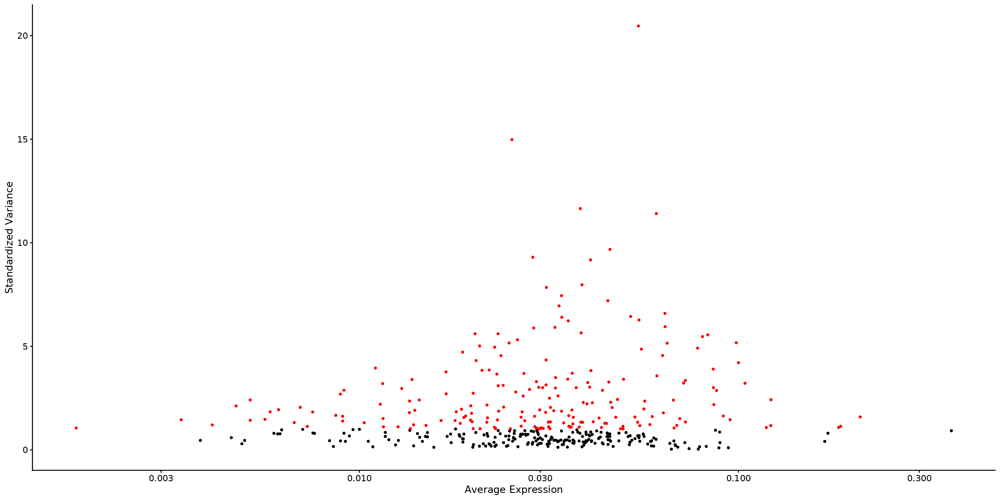

In [16]:
options(repr.plot.width=20, repr.plot.height=10) # To set the figure size in Jupyter
plot1 + NoLegend()

## Extended Fig. 3d - Feature Plot iGRN Activity

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


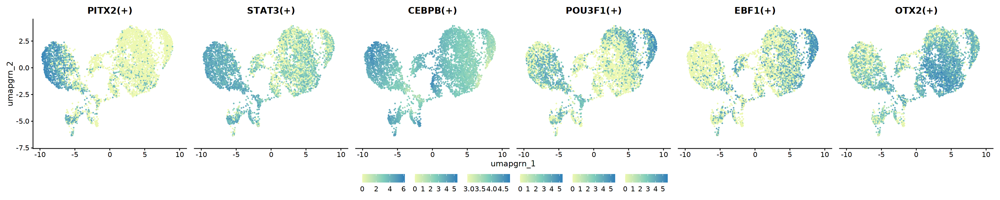

In [40]:
genes = c("PITX2(+)","STAT3(+)","CEBPB(+)","POU3F1(+)","EBF1(+)","OTX2(+)")

options(repr.plot.width = 25, repr.plot.height = 5)
DefaultAssay(data) = 'AUC'
FeaturePlot(data, reduction = "umap_grn", features = genes,ncol = 6, keep.scale="all") + plot_layout(axes = "collect", axis_titles = "collect", guides="collect") &
  theme(legend.position='bottom') & scale_colour_gradientn(colours = brewer.pal(n = 3, name = "YlGnBu"))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


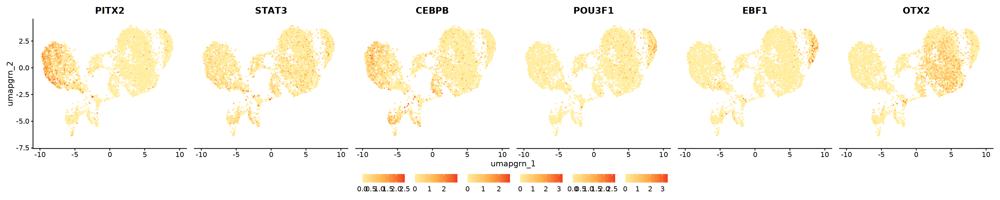

In [41]:
library(patchwork)
genes = c("PITX2","STAT3","CEBPB","POU3F1","EBF1","OTX2")

options(repr.plot.width = 25, repr.plot.height = 5)
DefaultAssay(data) = 'RNA'
FeaturePlot(data, reduction = "umap_grn", features = genes,ncol = 6, keep.scale="all") + plot_layout(axes = "collect", axis_titles = "collect", guides="collect") &
  theme(legend.position='bottom') & scale_colour_gradientn(colours = brewer.pal(n = 3, name = "YlOrRd"))

# Extended Fig 6

In [3]:
WT.data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/TXP_WT.rds")
PRO.data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/TXP_PRO.rds")
MES.data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/TXP_MES.rds")

neftel.data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/Neftel.rds")

In [4]:
Idents(neftel.data) <- 'orig.ident'

neftel.data <- RenameIdents(object = neftel.data, `102`="MGH102",`143`="MGH143",`105A`="MGH105",`126`="MGH126",
                        `114`="MGH114",`115`="MGH115",`118`="MGH118",`124`="MGH124",`125`="MGH125",`MGH104negP2`="MGH104",
                        `MGH104negP4`="MGH104",`MGH104negP7`="MGH104",`MGH105A`="MGH105",`MGH105B`="MGH105",`MGH105C`="MGH105",
                        `MGH105D`="MGH105",`MGH106CD3posP1`="MGH106",`MGH128CD45neg`="MGH128",`MGH129CD45neg`="MGH129",`MGH136CD45neg`="MGH136",
                        `MGH143CD45neg`="MGH143",`MGH151CD45neg`="MGH151",`MGH152CD45neg`="MGH152")

neftel.data$orig.ident <- neftel.data@active.ident

In [10]:
Idents(neftel.data) <- 'orig.ident'
levels(neftel.data)

[1] "MGH102" "MGH143" "MGH105" "MGH126" "MGH114" "MGH115" "MGH118" "MGH124"
 [9] "MGH125" "MGH104" "MGH106" "MGH128" "MGH129" "MGH136" "MGH151" "MGH152"
[17] "MGH101" "MGH100" "MGH110" "MGH113" "MGH121" "MGH122" "BT749"  "BT771" 
[25] "BT830"  "MGH85"  "BT1160" "BT1187" "BT786"  "BT920"  "MGH66"

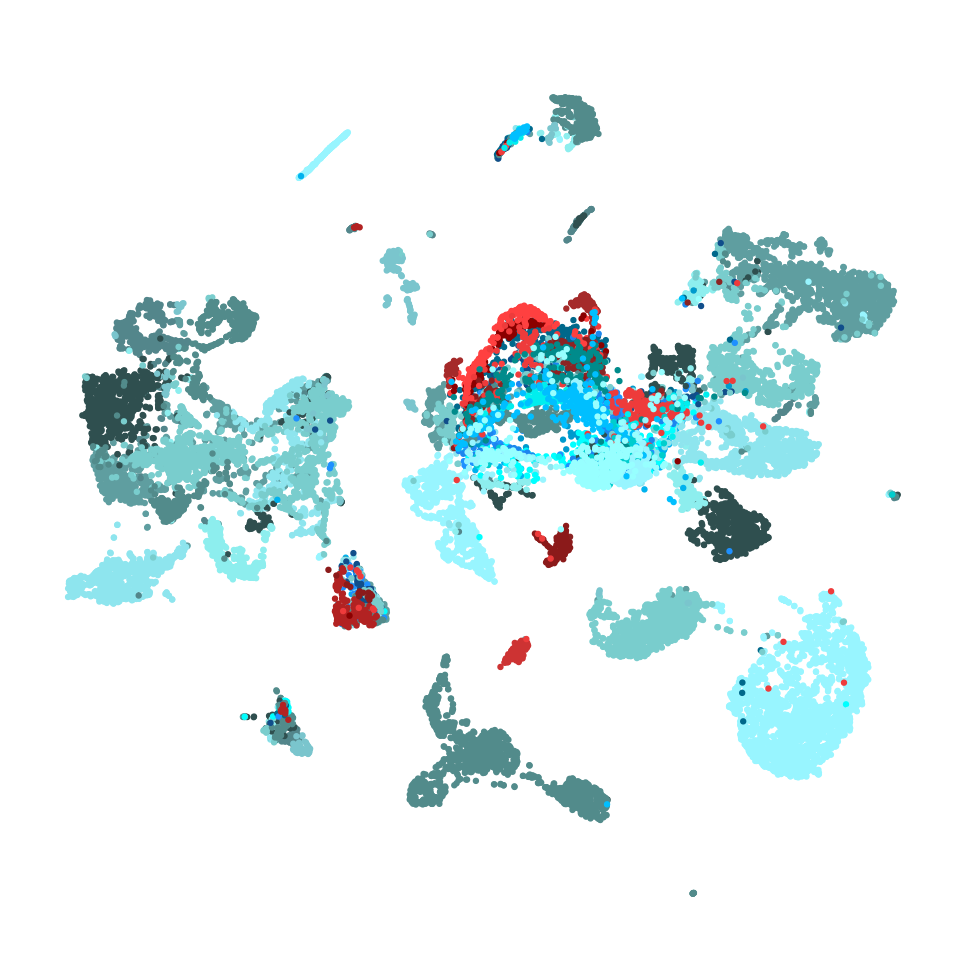

In [13]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(neftel.data, group.by = "orig.ident", label = FALSE, 
        cols=c('MGH102'='cadetblue','MGH143'='cadetblue1','MGH105'='cadetblue2','MGH126'='cadetblue3','MGH114'='cadetblue4','MGH115'='darkslategray','MGH66'='darkslategray1',
               'MGH118'='darkslategray2','MGH124'='darkslategray3','MGH125'='darkslategray4','MGH104'='cyan','MGH106'='cyan1','MGH128'='cyan2',
               'MGH129'='cyan3','MGH136'='cyan4','MGH151'='deepskyblue','MGH152'='deepskyblue1','MGH101'='deepskyblue2','MGH100'='deepskyblue3',
               'MGH110'='deepskyblue4','MGH113'='dodgerblue','MGH121'='dodgerblue2','MGH122'='dodgerblue4','BT749'='brown1','BT771'='brown2',
               'BT830'='brown3','MGH85'='brown','BT1160'='brown4','BT1187'='firebrick','BT786'='darkred','BT920'='firebrick4'), pt.size=0.75) + NoAxes() + ggtitle("") + NoLegend()

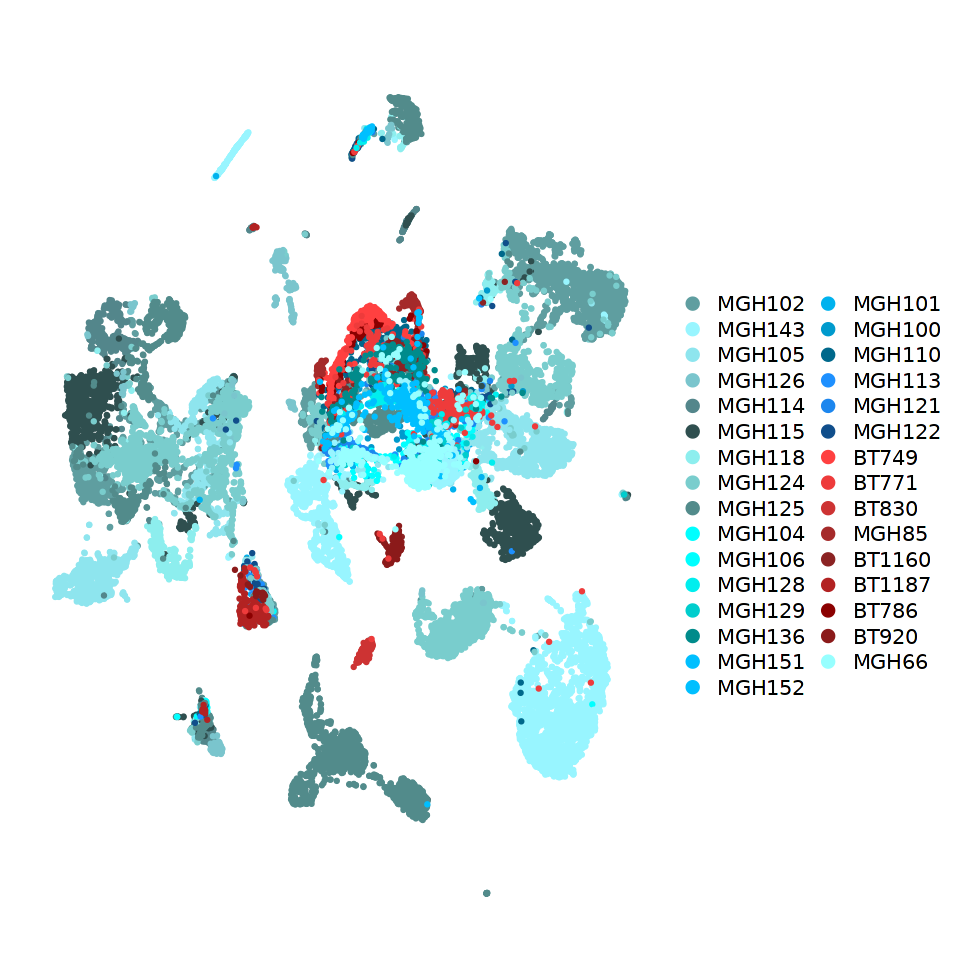

In [14]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(neftel.data, group.by = "orig.ident", label = FALSE, 
        cols=c('MGH102'='cadetblue','MGH143'='cadetblue1','MGH105'='cadetblue2','MGH126'='cadetblue3','MGH114'='cadetblue4','MGH115'='darkslategray','MGH66'='darkslategray1',
               'MGH118'='darkslategray2','MGH124'='darkslategray3','MGH125'='darkslategray4','MGH104'='cyan','MGH106'='cyan1','MGH128'='cyan2',
               'MGH129'='cyan3','MGH136'='cyan4','MGH151'='deepskyblue','MGH152'='deepskyblue1','MGH101'='deepskyblue2','MGH100'='deepskyblue3',
               'MGH110'='deepskyblue4','MGH113'='dodgerblue','MGH121'='dodgerblue2','MGH122'='dodgerblue4','BT749'='brown1','BT771'='brown2',
               'BT830'='brown3','MGH85'='brown','BT1160'='brown4','BT1187'='firebrick','BT786'='darkred','BT920'='firebrick4'), pt.size=0.75) + NoAxes() + ggtitle("") 

# Extended Figure 7

In [3]:
data.pro <- readRDS("GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-PRO_seurat.rds")
data.mes <- readRDS("GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-MES_seurat.rds")

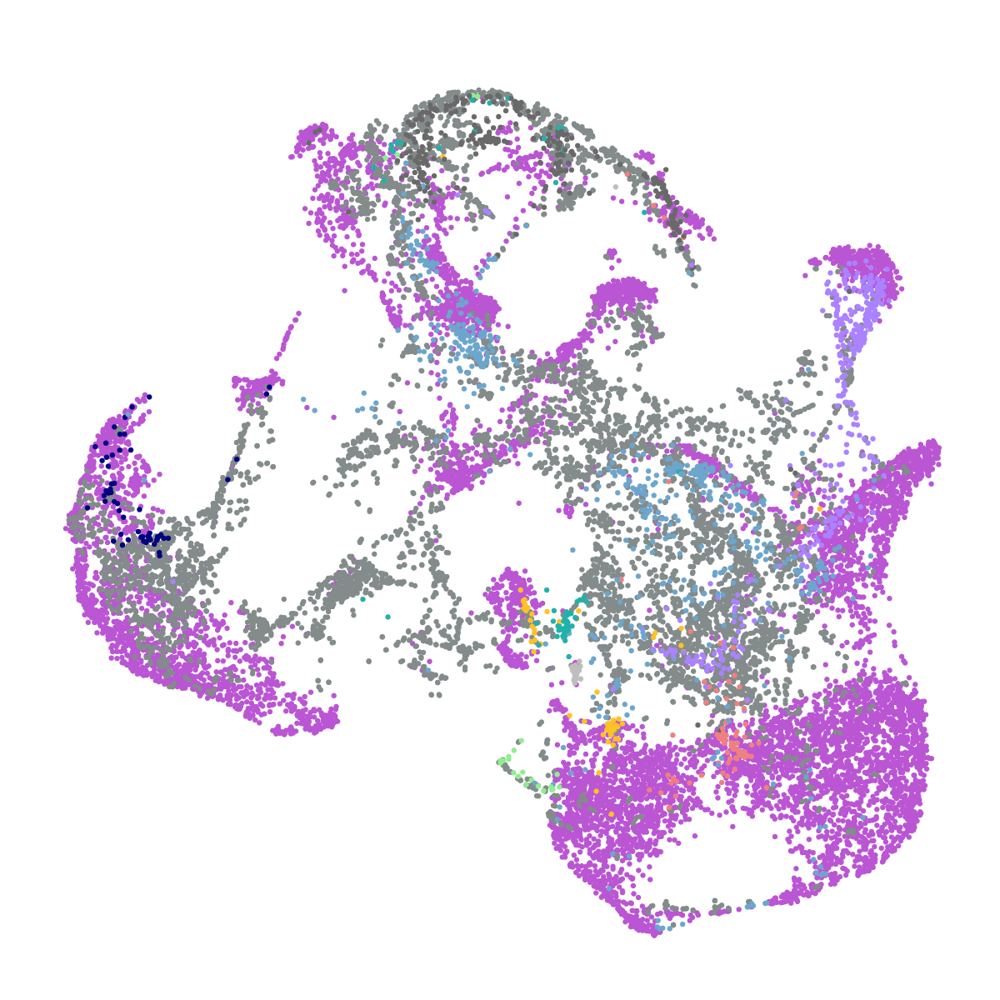

In [11]:
data.pro$celltype2 <- factor(data.pro$celltype2, levels=c("PT_Tumor","eGBO_Tumor","Proliferating","Radial Glia","Mesenchyme","Neural Crest",
                                                                  "Neuroepithelial","Retina Progenitor","Neuronal","Microglia","Endothelial"))

myColors <- c("azure4","mediumorchid","dimgray","skyblue3","mediumpurple1","lightseagreen","lightcoral","goldenrod1","navyblue","lightgreen","gray")

options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data.pro, reduction="umap.integrated.cca", cols=myColors, group.by="celltype2", label=FALSE, pt.size=0.75) + ggtitle("") + NoLegend() + NoAxes()

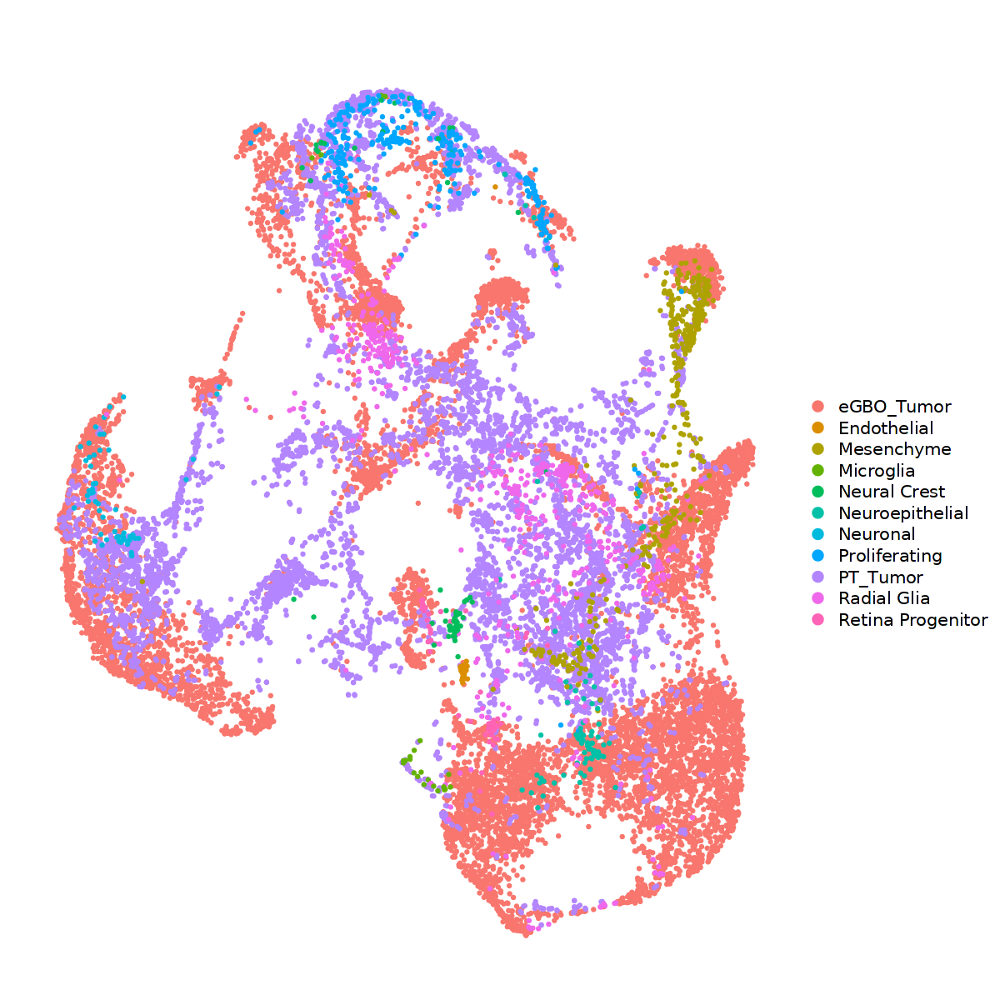

In [6]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data.pro, reduction="umap.integrated.cca", group.by="celltype2", label=FALSE, pt.size=0.75) + ggtitle("")  + NoAxes() 

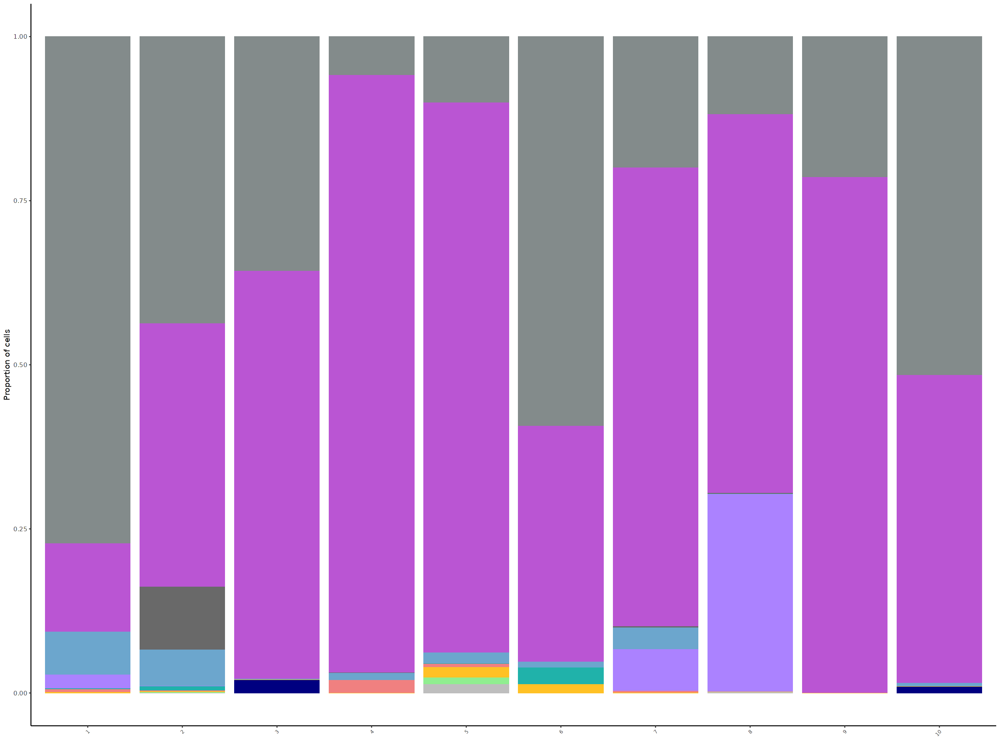

In [17]:
# Calculate cell type proportions
prop.pro <- data.frame(prop.table(table(data.pro$celltype2,data.pro$pt_clusters)))

colnames(prop.pro) <- c("CellType","Bin", "Frac")
prop.pro$CellType <- as.character(prop.pro$CellType)
prop.pro$Bin <- as.character(prop.pro$Bin)

prop.pro$CellType <- factor(prop.pro$CellType, levels=c("PT_Tumor","eGBO_Tumor","Proliferating","Radial Glia","Mesenchyme","Neural Crest",
                                                                  "Neuroepithelial","Retina Progenitor","Neuronal","Microglia","Endothelial"))
prop.pro$Bin <- factor(prop.pro$Bin, levels=c("0","1","2","3","4","5","6","7","8","9","10"))

options(repr.plot.width = 8, repr.plot.height = 15)

myColors <- c("azure4","mediumorchid","dimgray","skyblue3","mediumpurple1","lightseagreen","lightcoral","goldenrod1","navyblue","lightgreen","gray")

prop.pro.plot <- ggplot(prop.pro, aes(fill=factor(CellType), y=Frac, x=Bin)) +
  geom_bar(position="fill", stat="identity", width = .9) +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1, size = 7)) +
  labs(x = "", y = "Proportion of cells") +
  guides(fill = guide_legend(title="Cell Type")) + scale_fill_manual(values=myColors) + NoLegend()

options(repr.plot.width=20, repr.plot.height=15)
prop.pro.plot

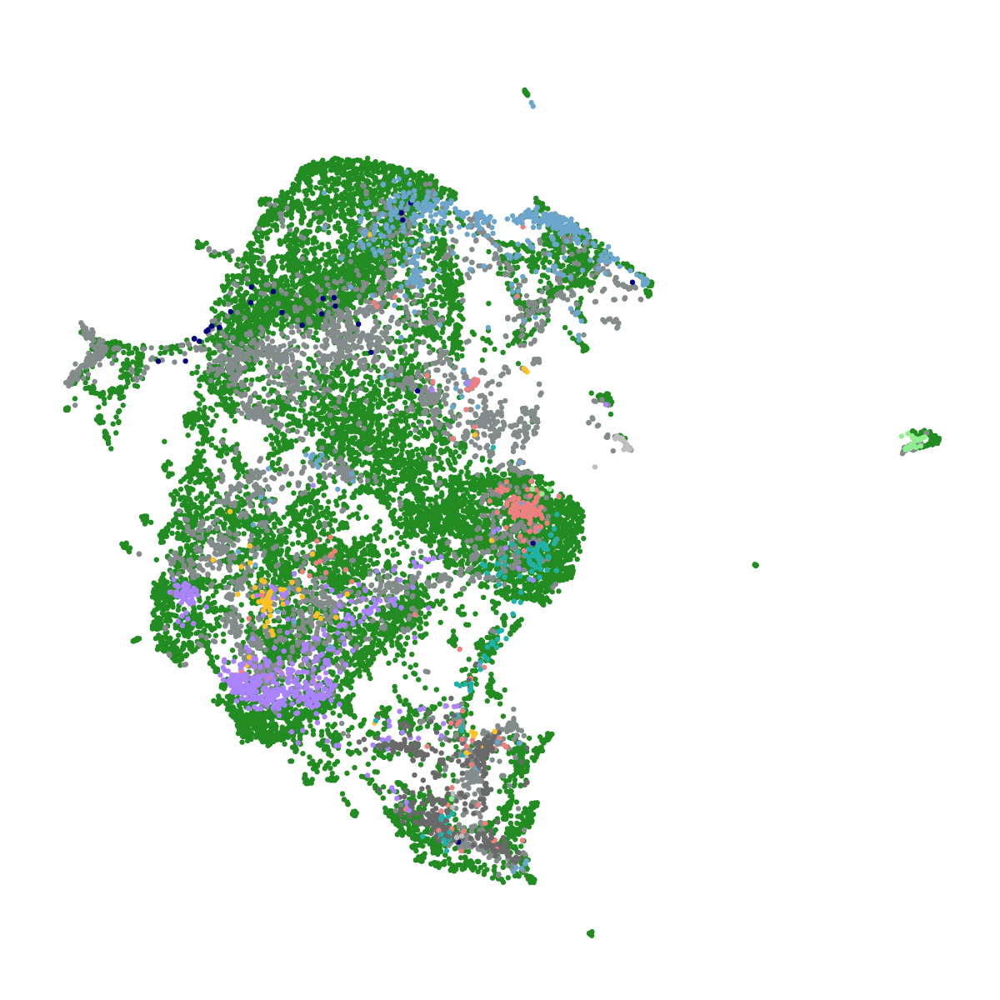

In [10]:
data.mes$celltype2 <- factor(data.mes$celltype2, levels=c("PT_Tumor","eGBO_Tumor","Proliferating","Radial Glia","Mesenchyme","Neural Crest",
                                                                  "Neuroepithelial","Retina Progenitor","Neuronal","Microglia","Endothelial"))

myColors <- c("azure4","forestgreen","dimgray","skyblue3","mediumpurple1","lightseagreen","lightcoral","goldenrod1","navyblue","lightgreen","gray")

options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data.mes, reduction="umap.integrated.cca", cols=myColors, group.by="celltype2", label=FALSE, pt.size=0.75) + ggtitle("") + NoLegend() + NoAxes()

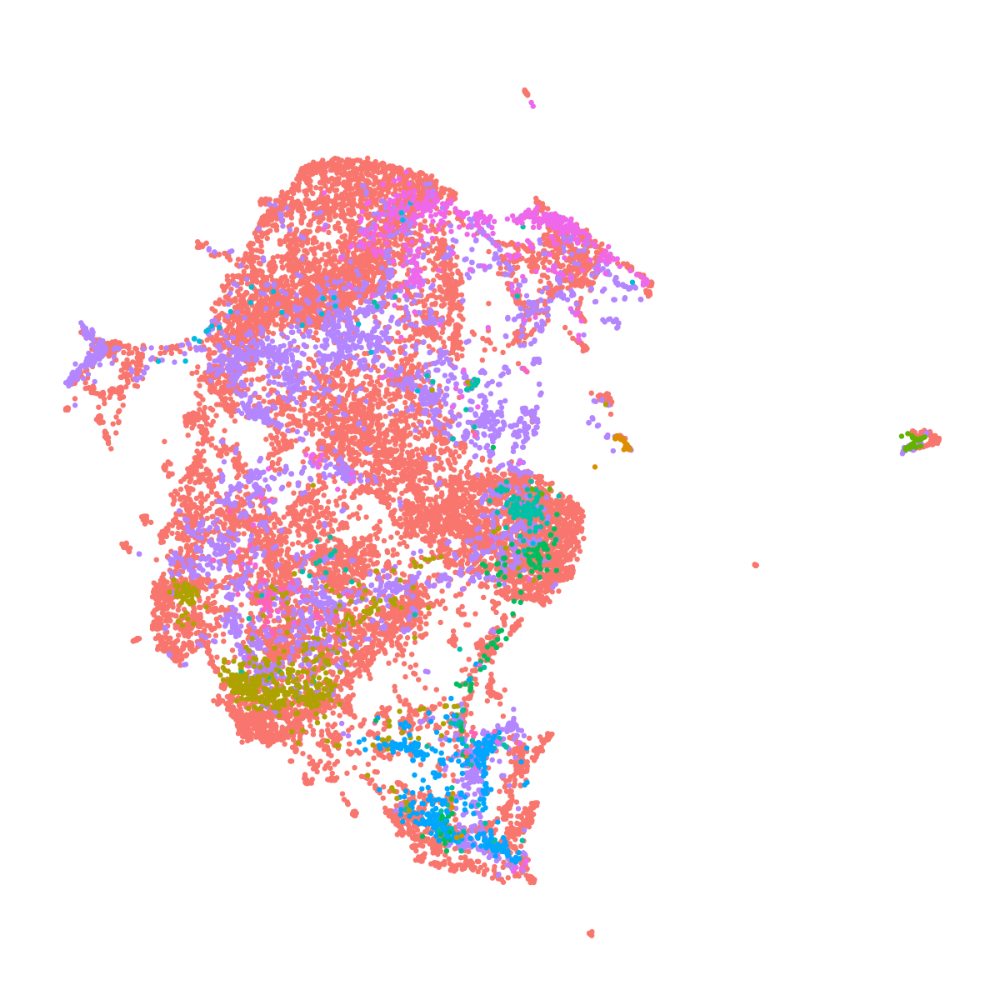

In [5]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data.mes, reduction="umap.integrated.cca", group.by="celltype2", label=FALSE, pt.size=0.75) + ggtitle("") + NoLegend() + NoAxes()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


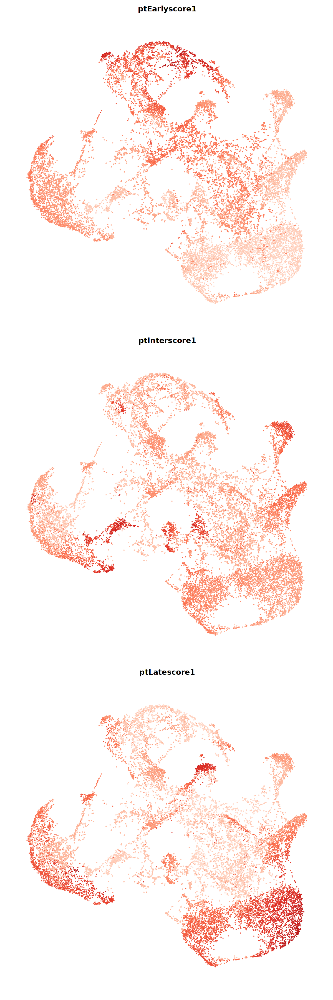

In [19]:
options(repr.plot.width=10, repr.plot.height=30)
p1 <- FeaturePlot(data.pro, c("ptEarlyscore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes() + scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))
p2 <- FeaturePlot(data.pro, c("ptInterscore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes() + scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))
p3 <- FeaturePlot(data.pro, c("ptLatescore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes()+ scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))

p1+p2+p3 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


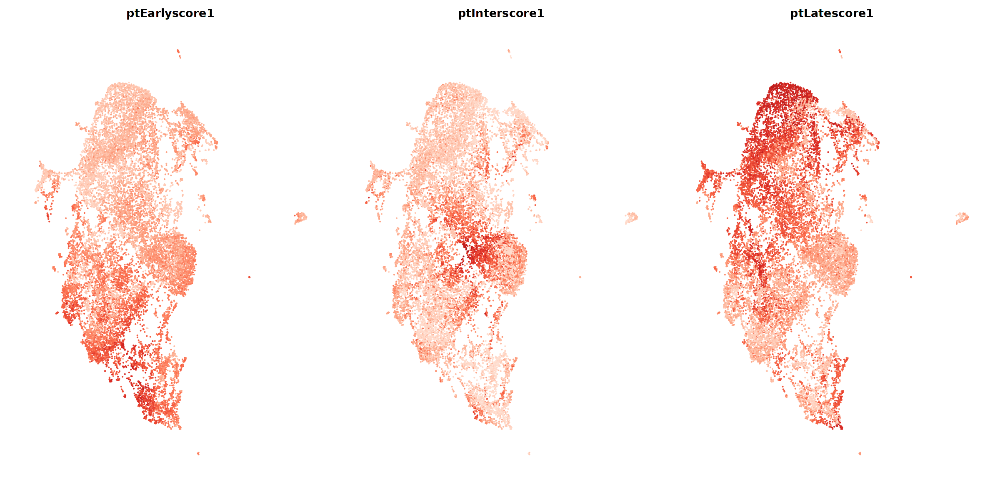

In [16]:
options(repr.plot.width=20, repr.plot.height=10)
p1 <- FeaturePlot(data.mes, c("ptEarlyscore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes() + scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))
p2 <- FeaturePlot(data.mes, c("ptInterscore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes() + scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))
p3 <- FeaturePlot(data.mes, c("ptLatescore1"), reduction="umap.integrated.cca", pt.size = 0.1) + NoLegend() + NoAxes()+ scale_colour_gradientn(colours = brewer.pal(n = 5, name = "Reds"))

p1|p2|p3 